# Mushroom - OneHotEncoding
- https://archive.ics.uci.edu/dataset/73/mushroom
- no null values
- all variables categorical
- class target: ['poisonous', 'edible']
- random forest classifier

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
col_names = ['class','cap-shape','cap-surface','cap-colour',
             'bruises','odour','gill-attachment','gill-spacing',
             'gill-size','gill-colour','stalk-shape','stalk-root',
             'stalk-surface-above-ring','stalk-surface-below-ring','stalk-colour-above-ring',
             'stalk-colour-below-ring','veil-type','veil-colour','ring-number',
             'ring-type','spore-print-colour','population','habitat'
]

class_names = ['poisonous', 'edible']

df = pd.read_csv('../data/mushroom/agaricus-lepiota.data', header=None, names=col_names)

# Rename values
df['class'] = df['class'].replace('p', 'poisonous')
df['class'] = df['class'].replace('e', 'edible')

df['class'].value_counts()

class
edible       4208
poisonous    3916
Name: count, dtype: int64

### Mappings
- replacing values with words

In [3]:
cap_shape_map = {
    'b': 'bell',
    'c': 'conical',
    'x': 'convex',
    'f': 'flat',
    'k': 'knobbed',
    's': 'sunken'
}
df['cap-shape'] = df['cap-shape'].map(cap_shape_map)

cap_surface_map = {
    'f': 'fibrous',
    'g': 'grooves',
    'y': 'scaly',
    's': 'smooth'
}
df['cap-surface'] = df['cap-surface'].map(cap_surface_map)

cap_colour_map = {
    'n': 'brown',
    'b': 'buff',
    'c': 'cinnamon',
    'g': 'grey',
    'r': 'green',
    'p': 'pink',
    'u': 'purple',
    'e': 'red',
    'w': 'white',
    'y': 'yellow'
}
df['cap-colour'] = df['cap-colour'].map(cap_colour_map)


bruises_map = {
    't': 'bruises',
    'f': 'no'
}
df['bruises'] = df['bruises'].map(bruises_map)

odour_map = {
    'a': 'almond',
    'l': 'anise',
    'c': 'creosote',
    'y': 'fishy',
    'f': 'foul',
    'm': 'musty',
    'n': 'none',
    'p': 'pungent',
    's': 'spicy'
}
df['odour'] = df['odour'].map(odour_map)

gill_attachment_map = {
    'a': 'attached',
    'd': 'descending',
    'f': 'free',
    'n': 'notched'
}
df['gill-attachment'] = df['gill-attachment'].map(gill_attachment_map)

gill_spacing_map = {
    'c': 'close',
    'w': 'crowded',
    'd': 'distant'
}
df['gill-spacing'] = df['gill-spacing'].map(gill_spacing_map)

gill_size_map = {
    'b': 'broad',
    'n': 'narrow'
}
df['gill-size'] = df['gill-size'].map(gill_size_map)

gill_colour_map = {
    'k': 'black',
    'n': 'brown',
    'b': 'buff',
    'h': 'chocolate',
    'g': 'grey',
    'r': 'green',
    'o': 'orange',
    'p': 'pink',
    'u': 'purple',
    'e': 'red',
    'w': 'white',
    'y': 'yellow'
}
df['gill-colour'] = df['gill-colour'].map(gill_colour_map)

stalk_shape_map = {
    'e': 'enlarging',
    't': 'tapering'
}
df['stalk-shape'] = df['stalk-shape'].map(stalk_shape_map)

stalk_root_map = {
    'b': 'bulbous',
    'c': 'club',
    'u': 'cup',
    'e': 'equal',
    'z': 'rhizomorphs',
    'r': 'rooted',
    '?': 'missing'
}
df['stalk-root'] = df['stalk-root'].map(stalk_root_map)

stalk_surface_above_ring_map = {
    'f': 'fibrous',
    'y': 'scaly',
    'k': 'silky',
    's': 'smooth'
}
df['stalk-surface-above-ring'] = df['stalk-surface-above-ring'].map(stalk_surface_above_ring_map)

stalk_surface_below_ring_map = {
    'f': 'fibrous',
    'y': 'scaly',
    'k': 'silky',
    's': 'smooth'
}
df['stalk-surface-below-ring'] = df['stalk-surface-below-ring'].map(stalk_surface_below_ring_map)

stalk_colour_above_ring_map = {
    'n': 'brown',
    'b': 'buff',
    'c': 'cinnamon',
    'g': 'grey',
    'o': 'orange',
    'p': 'pink',
    'e': 'red',
    'w': 'white',
    'y': 'yellow'
}
df['stalk-colour-above-ring'] = df['stalk-colour-above-ring'].map(stalk_colour_above_ring_map)

stalk_colour_below_ring_map = {
    'n': 'brown',
    'b': 'buff',
    'c': 'cinnamon',
    'g': 'grey',
    'o': 'orange',
    'p': 'pink',
    'e': 'red',
    'w': 'white',
    'y': 'yellow'
}
df['stalk-colour-below-ring'] = df['stalk-colour-below-ring'].map(stalk_colour_below_ring_map)

veil_type_map = {
    'p': 'partial',
    'u': 'universal'
}
df['veil-type'] = df['veil-type'].map(veil_type_map)

veil_colour_map = {
    'n': 'brown',
    'o': 'orange',
    'w': 'white',
    'y': 'yellow'
}
df['veil-colour'] = df['veil-colour'].map(veil_colour_map)

ring_number_map = {
    'n': 'none',
    'o': 'one',
    't': 'two'
}
df['ring-number'] = df['ring-number'].map(ring_number_map)

ring_type_map = {
    'c': 'cobwebby',
    'e': 'evanescent',
    'f': 'flaring',
    'l': 'large',
    'n': 'none',
    'p': 'pendant',
    's': 'sheathing',
    'z': 'zone'
}
df['ring-type'] = df['ring-type'].map(ring_type_map)

spore_print_colour_map = {
    'k': 'black',
    'n': 'brown',
    'b': 'buff',
    'h': 'chocolate',
    'r': 'green',
    'o': 'orange',
    'u': 'purple',
    'w': 'white',
    'y': 'yellow'
}
df['spore-print-colour'] = df['spore-print-colour'].map(spore_print_colour_map)

population_map = {
    'a': 'abundant',
    'c': 'clustered',
    'n': 'numerous',
    's': 'scattered',
    'v': 'several',
    'y': 'solitary'
}
df['population'] = df['population'].map(population_map)

habitat_map = {
    'g': 'grasses',
    'l': 'leaves',
    'm': 'meadows',
    'p': 'paths',
    'u': 'urban',
    'w': 'waste',
    'd': 'woods'
}
df['habitat'] = df['habitat'].map(habitat_map)

In [4]:
df.head()

,class,cap-shape,cap-surface,cap-colour,bruises,odour,gill-attachment,gill-spacing,gill-size,gill-colour,...,stalk-surface-below-ring,stalk-colour-above-ring,stalk-colour-below-ring,veil-type,veil-colour,ring-number,ring-type,spore-print-colour,population,habitat
0,poisonous,convex,smooth,brown,bruises,pungent,free,close,narrow,black,...,smooth,white,white,partial,white,one,pendant,black,scattered,urban
1,edible,convex,smooth,yellow,bruises,almond,free,close,broad,black,...,smooth,white,white,partial,white,one,pendant,brown,numerous,grasses
2,edible,bell,smooth,white,bruises,anise,free,close,broad,brown,...,smooth,white,white,partial,white,one,pendant,brown,numerous,meadows
3,poisonous,convex,scaly,white,bruises,pungent,free,close,narrow,brown,...,smooth,white,white,partial,white,one,pendant,black,scattered,urban
4,edible,convex,smooth,grey,no,none,free,crowded,broad,black,...,smooth,white,white,partial,white,one,evanescent,brown,abundant,grasses


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   class                     8124 non-null   object
 1   cap-shape                 8124 non-null   object
 2   cap-surface               8124 non-null   object
 3   cap-colour                8124 non-null   object
 4   bruises                   8124 non-null   object
 5   odour                     8124 non-null   object
 6   gill-attachment           8124 non-null   object
 7   gill-spacing              8124 non-null   object
 8   gill-size                 8124 non-null   object
 9   gill-colour               8124 non-null   object
 10  stalk-shape               8124 non-null   object
 11  stalk-root                8124 non-null   object
 12  stalk-surface-above-ring  8124 non-null   object
 13  stalk-surface-below-ring  8124 non-null   object
 14  stalk-colour-above-ring 

### Data encoding

In [6]:
from sklearn.preprocessing import OneHotEncoder

# Categories for OneHotEncoding
categories = []

# List unique values of each column
for col in df.columns[1:]:
    categories.append(df[col].unique())

# Initialise the OneHotEncoder with defined categories
oh_enc = OneHotEncoder(categories=categories)

# List of categorical columns (excluded class column)
cat_cols = col_names[1:]

# Encode each categorical column
oh_enc.fit(df[cat_cols])
oh_enc_data = oh_enc.transform(df[cat_cols]).toarray()
new_feature_names = oh_enc.get_feature_names_out(cat_cols)

# Create a DataFrame with encoded data
X = pd.DataFrame(oh_enc_data, columns=new_feature_names)

# Encoding class column with numerical values
class_mapping = {'poisonous': 0, 'edible': 1}
y = df['class'].map(class_mapping)

In [7]:
categories_dict = {i: list(cat) for i, cat in enumerate(oh_enc.categories_)}

### Model

In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Split data to test and train data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Create RFC model
model = RandomForestClassifier(max_depth=2, n_estimators=5, random_state=1)

# Train RFC model
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=2, n_estimators=5, random_state=1)

### Model Evaluation

In [9]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Predictions on training data
y_train_pred = model.predict(X_train)

# Predictions on test data
y_test_pred = model.predict(X_test)

# Evaluation on training data
train_accuracy = accuracy_score(y_train, y_train_pred)
train_classification_report = classification_report(y_train, y_train_pred)
train_confusion_matrix = confusion_matrix(y_train, y_train_pred)

# Evaluation on test data
test_accuracy = accuracy_score(y_test, y_test_pred)
test_classification_report = classification_report(y_test, y_test_pred)
test_confusion_matrix = confusion_matrix(y_test, y_test_pred)

# Output results
print("Training Data Evaluation:")
print(f"Accuracy: {train_accuracy:.4f}")
print("Classification Report:\n", train_classification_report)
print("Confusion Matrix:\n", train_confusion_matrix)

print("\nTest Data Evaluation:")
print(f"Accuracy: {test_accuracy:.4f}")
print("Classification Report:\n", test_classification_report)
print("Confusion Matrix:\n", test_confusion_matrix)

Training Data Evaluation:
Accuracy: 0.9715
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.95      0.97      3111
           1       0.96      0.99      0.97      3388

    accuracy                           0.97      6499
   macro avg       0.97      0.97      0.97      6499
weighted avg       0.97      0.97      0.97      6499

Confusion Matrix:
 [[2970  141]
 [  44 3344]]

Test Data Evaluation:
Accuracy: 0.9662
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.94      0.96       805
           1       0.94      1.00      0.97       820

    accuracy                           0.97      1625
   macro avg       0.97      0.97      0.97      1625
weighted avg       0.97      0.97      0.97      1625

Confusion Matrix:
 [[754  51]
 [  4 816]]


In [10]:
X_test.shape

(1625, 117)

In [11]:
X_train.shape

(6499, 117)

## Permutation Feature Importance

In [12]:
from eli5 import show_weights, show_prediction, explain_weights_df
from eli5.sklearn import PermutationImportance

In [13]:
# Permutation feature importance - TRAIN DATA
perm_train = PermutationImportance(model, random_state=1).fit(X_train, y_train)
show_weights(perm_train, feature_names=list(X_test.columns))

Weight,Feature
0.0846 ± 0.0069,odour_none
0.0418 ± 0.0024,odour_foul
0.0251 ± 0.0037,gill-size_broad
0.0110 ± 0.0017,stalk-surface-above-ring_smooth
0.0108 ± 0.0013,odour_almond
0.0104 ± 0.0016,bruises_bruises
0.0085 ± 0.0008,cap-colour_yellow
0.0062 ± 0.0017,gill-spacing_crowded
0.0055 ± 0.0009,habitat_meadows
0.0015 ± 0.0007,odour_spicy


In [14]:
# Permutation feature importance - TEST DATA
perm_test = PermutationImportance(model, random_state=1).fit(X_test, y_test)
show_weights(perm_test, feature_names=list(X_test.columns))

Weight,Feature
0.0807 ± 0.0046,odour_none
0.0390 ± 0.0073,odour_foul
0.0279 ± 0.0055,gill-size_broad
0.0138 ± 0.0063,bruises_bruises
0.0111 ± 0.0032,stalk-surface-above-ring_smooth
0.0102 ± 0.0027,cap-colour_yellow
0.0076 ± 0.0029,odour_almond
0.0050 ± 0.0018,habitat_meadows
0.0016 ± 0.0023,odour_spicy
0.0012 ± 0.0026,gill-spacing_crowded


## PDP
- accroding to SHAP feature importance [odor, bruises, stalk-surface-above-ring, gill-spacing, habitat]

In [15]:
df['odour'].unique()

array(['pungent', 'almond', 'anise', 'none', 'foul', 'creosote', 'fishy',
       'spicy', 'musty'], dtype=object)

In [16]:
# Copy OneHotEncoded dataset to add class column
X_new = X_test.copy()
X_new['class'] = y
odour_cols = ['odour_pungent', 'odour_almond', 'odour_anise', 'odour_none', 'odour_foul', 'odour_creosote', 'odour_fishy',
       'odour_spicy', 'odour_musty']

In [17]:
from pdpbox import pdp, info_plots

In [18]:
# Target distribution
target_mushroom = info_plots.TargetPlot(
    df=X_new,
    feature=odour_cols,
    feature_name="odour",
    target='class'
)

In [19]:
fig, axes, summary_df = target_mushroom.plot(
    figsize=None,
    ncols=2,
    plot_params=None,
    engine='plotly', # plotly
    template='plotly_white',
)
fig

In [20]:
predict_odour = info_plots.PredictPlot(
    model=model,
    df=X_new,
    model_features=X_new.columns[:-1],
    feature=odour_cols,
    feature_name="odour",
)

obtain pred_func from the provided model.


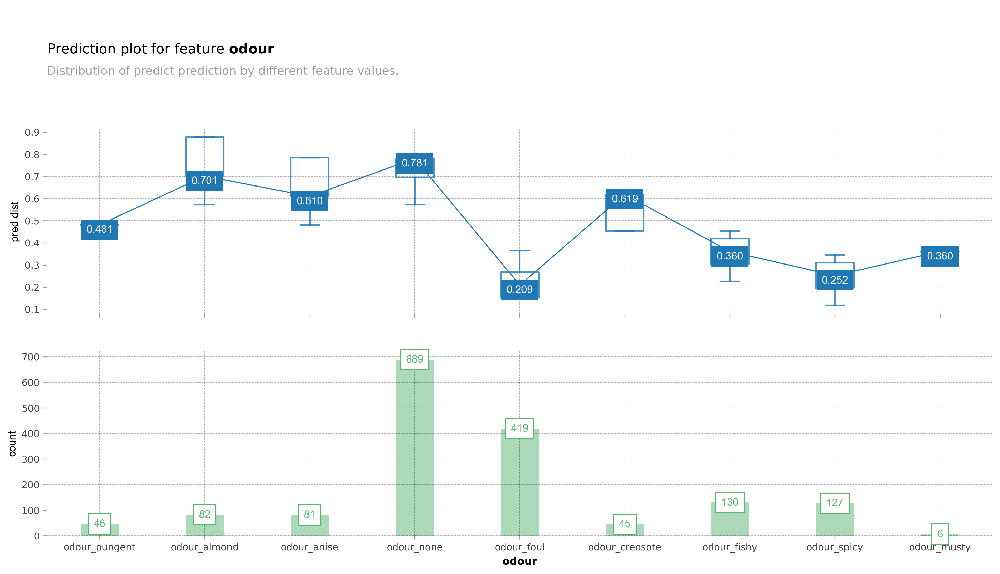

In [21]:
fig, axes, summary_df = predict_odour.plot(
    engine='matplotlib',
    template='plotly_white',
)

In [22]:
pdp_odour = pdp.PDPIsolate(
    model=model,
    df=X_new,
    model_features=X_new.columns[:-1],
    feature=odour_cols,
    feature_name="odour",
)

obtain pred_func from the provided model.


  0%|          | 0/9 [00:00<?, ?it/s]

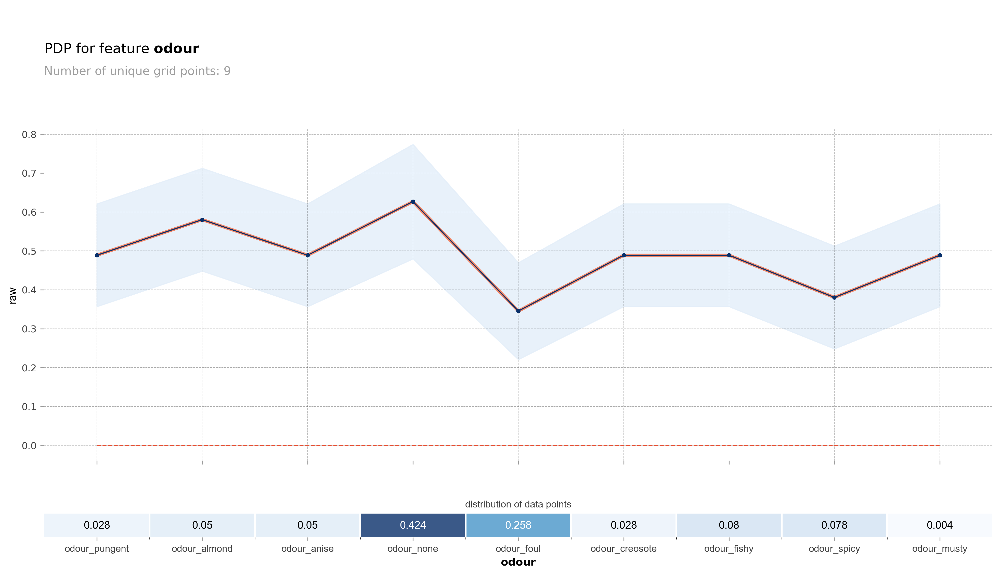

In [23]:
# PDP only with matplotlib engine otherwise it damages the pictures
fig, axes = pdp_odour.plot(
    center=False,
    plot_lines=False, #Pro ICE přepsat na TRUE
    plot_pts_dist=True,
    to_bins=True,
    plot_params={"pdp_hl": True, "line": {"hl_color": "#f46d43"}},
    template='plotly_white',
    engine='matplotlib'
)

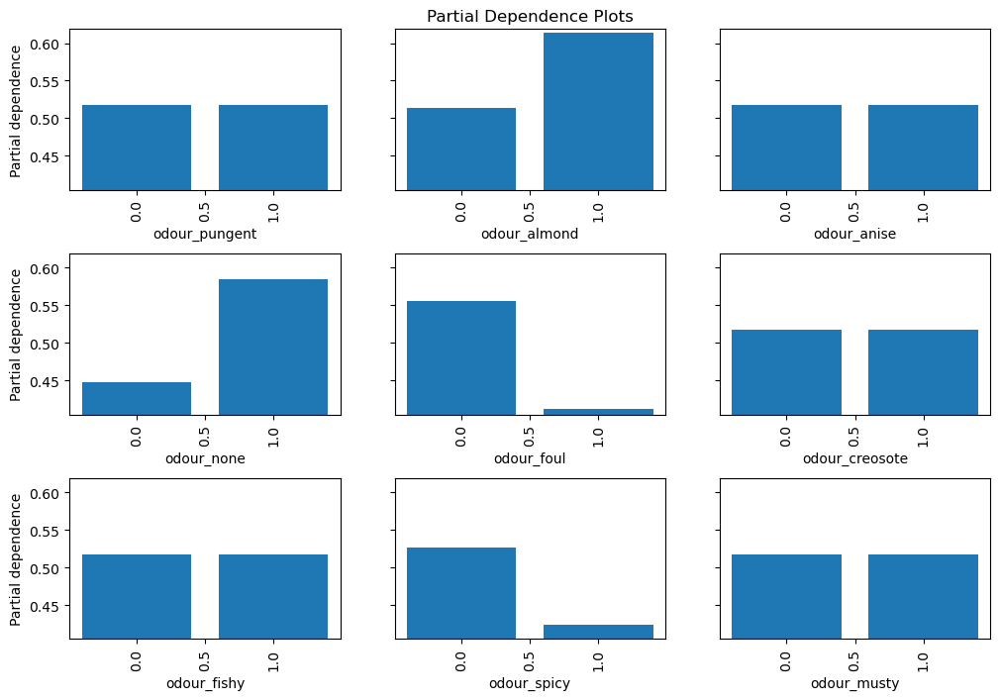

In [24]:
from sklearn.inspection import PartialDependenceDisplay

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=model,
    X=X_test,
    features=odour_cols,               # the features to plot
    categorical_features = odour_cols, # categorical features
    random_state=1,
    ax=ax,
)

plt.subplots_adjust(wspace=0.2, hspace=0.4)
plt.show()

## ICE

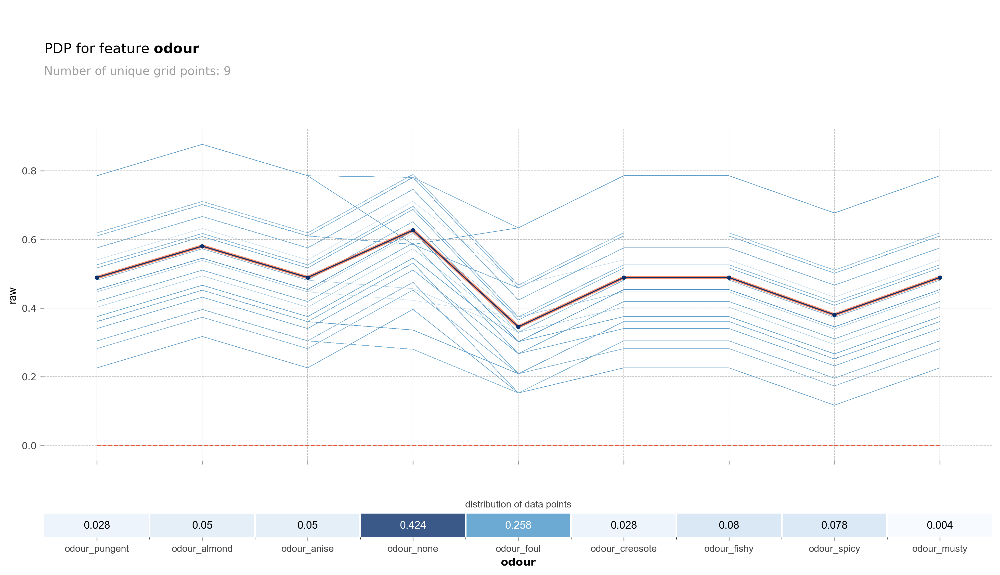

In [25]:
# PDP only with matplotlib engine otherwise it damages the pictures
fig, axes = pdp_odour.plot(
    center=False,
    plot_lines=True,
    plot_pts_dist=True,
    to_bins=True,
    plot_params={"pdp_hl": True, "line": {"hl_color": "#f46d43"}},
    template='plotly_white',
    engine='matplotlib'
)

## ALE

In [26]:
from PyALE import ale
# Get same data frame as X_test from train_test_split
X_test_ale = df.reindex(X_test.index)

PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.
PyALE._ALE_generic:INFO: Discrete feature detected.


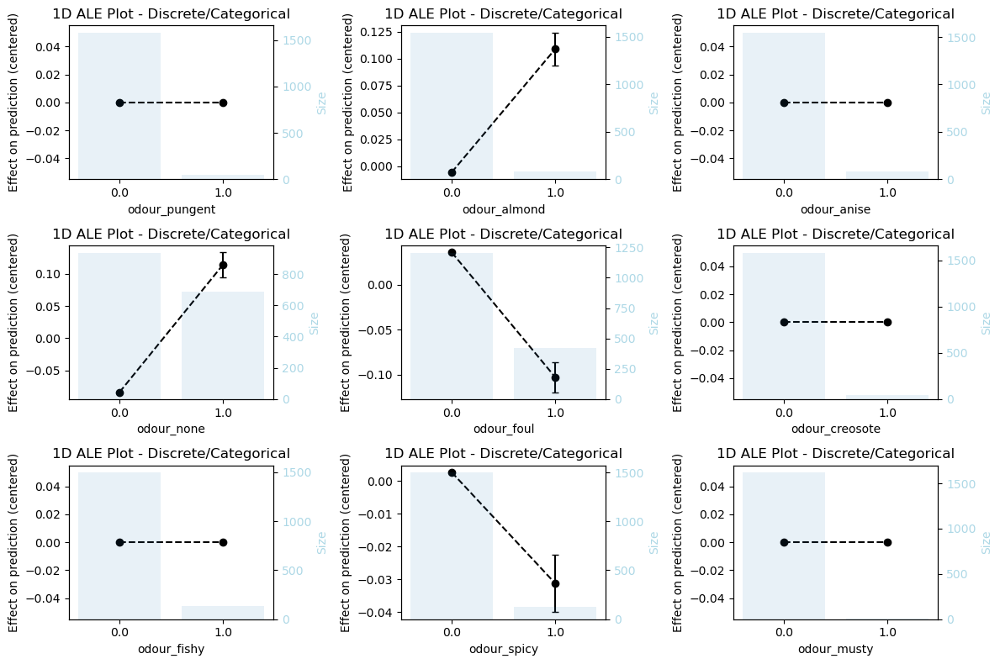

In [27]:
import matplotlib.pyplot as plt

# Create a 3x3 grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 8))

# Adjust the spacing between the plots
plt.subplots_adjust(wspace=0.2, hspace=0.4)

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop over each column in odour_cols and generate ALE plot
for i, col in enumerate(X_test[odour_cols]):
    ale_eff = ale(
        X=X_test,
        model=model,
        feature=[col],
        predictors=X_test.columns,
        fig=fig,       # Pass the figure
        ax=axes[i]     # Pass the correct axis
    )

# Display the plot
plt.show()

## LIME

In [28]:
import lime.lime_tabular

In [29]:
# Simple Lime tabular explainer with all classification class
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,
                                      feature_names=X_test.columns,
                                      categorical_features=range(0, len(X_test.columns)),
                                      mode='classification',
                                      class_names=class_mapping,
                                      random_state=1)

explanation = lime_explainer.explain_instance(X_test.iloc[0].values, model.predict_proba, num_features=8)

explanation.show_in_notebook(show_table=True)

In [30]:
explanation = lime_explainer.explain_instance(X_test.iloc[3].values, model.predict_proba, num_features=8)
explanation.show_in_notebook(show_table=True)

### LIME from tutorial with LaberEncoder

In [31]:
from sklearn.preprocessing import LabelEncoder

# Copy the original dataset without class column
lime_df = df.iloc[:, 1:].copy()

# Prepare dictionary to map values for the explainer
label_categories = {}

# Initialise a LabelEncoder
le_enc = LabelEncoder()
    
for i, col in enumerate(lime_df.columns):
    # Initialise new LabelEncoder
    le = LabelEncoder()
    # Fit the label encoder and transform the column
    lime_df[col] = le.fit_transform(lime_df[col])
    # Store the label categories
    label_categories[i] = le.classes_
    
# Split data to train and test
lime_X_train, lime_X_test, lime_y_train, lime_y_test = train_test_split(lime_df, y, test_size=0.2, random_state=1)

# OneHotEncode the train data
lime_ohe = OneHotEncoder()
lime_ohe.fit(lime_df)
lime_encoded = lime_ohe.transform(lime_X_train)

# Initialise the Random Forest Classifier
lime_model = RandomForestClassifier(max_depth=2, n_estimators=5, random_state=1)

# Train the Random Forest Classifier on one-hot encoded data
lime_model.fit(lime_encoded, lime_y_train)

RandomForestClassifier(max_depth=2, n_estimators=5, random_state=1)

In [32]:
accuracy_score(lime_y_test, lime_model.predict(lime_ohe.transform(lime_X_test)))

0.8898461538461538

In [33]:
explainer = lime.lime_tabular.LimeTabularExplainer(lime_X_train.values, 
                                                   class_names=class_names, 
                                                   feature_names=col_names[1:],
                                                   categorical_features=range(0, 22), 
                                                   categorical_names=label_categories,
                                                   kernel_width=3, verbose=False)

In [34]:
predict_fn = lambda x: lime_model.predict_proba(lime_ohe.transform(x))

exp = explainer.explain_instance(lime_X_test.iloc[0, :], predict_fn, num_features=len(lime_X_test))
exp.show_in_notebook()

## Anchors

In [35]:
from alibi.explainers import AnchorTabular

In [36]:
feature_names = col_names[1:]

In [37]:
explainer = AnchorTabular(
    predictor=model.predict_proba,
    feature_names=feature_names,
    categorical_names=categories_dict,
    ohe=True,
    seed=1
)

In [38]:
explainer.fit(X_train.values, disc_perc=[25, 50, 75])

AnchorTabular(meta={
  'name': 'AnchorTabular',
  'type': ['blackbox'],
  'explanations': ['local'],
  'params': {'seed': 1, 'disc_perc': [25, 50, 75]},
  'version': '0.9.6'}
)

In [39]:
# ID of an instance
idx = 0

# Anchor with threshold 0.95
instance_enc = X_test.iloc[idx].values.reshape(1, -1)
explanation = explainer.explain(instance_enc, threshold=0.95)

anchor_text = ""

for i, anchor in enumerate(explanation.anchor):
    if i == 0:
        anchor_text += 'IF ' + anchor
    else:
        anchor_text += '\nAND ' + anchor
    
anchor_text += f"\nTHEN PREDICT: {class_names[explainer.predictor(X_test.iloc[idx].values.reshape(1, -1))[0]]}"
anchor_text += f"\nWITH PRECISION: {explanation.precision:.2f}"
anchor_text += f"\nAND COVERAGE: {explanation.coverage:.2f}"

print(anchor_text)

IF odour = none
AND stalk-root = equal
THEN PREDICT: edible
WITH PRECISION: 1.00
AND COVERAGE: 0.10


In [40]:
# Anchor with threshold 0.75
instance_enc = X_test.iloc[idx].values.reshape(1, -1)
explanation = explainer.explain(instance_enc, threshold=0.75)

anchor_text = ""

for i, anchor in enumerate(explanation.anchor):
    if i == 0:
        anchor_text += 'IF ' + anchor
    else:
        anchor_text += '\nAND ' + anchor
    
anchor_text += f"\nTHEN PREDICT: {class_names[explainer.predictor(X_test.iloc[idx].values.reshape(1, -1))[0]]}"
anchor_text += f"\nWITH PRECISION: {explanation.precision:.2f}"
anchor_text += f"\nAND COVERAGE: {explanation.coverage:.2f}"

print(anchor_text)

IF odour = none
THEN PREDICT: edible
WITH PRECISION: 0.80
AND COVERAGE: 0.45


In [41]:
# Anchor with threshold 0.50
instance_enc = X_test.iloc[idx].values.reshape(1, -1)
explanation = explainer.explain(instance_enc, threshold=0.5)

anchor_text = ""

for i, anchor in enumerate(explanation.anchor):
    if i == 0:
        anchor_text += 'IF ' + anchor
    else:
        anchor_text += '\nAND ' + anchor
    
anchor_text += f"\nTHEN PREDICT: {class_names[explainer.predictor(X_test.iloc[idx].values.reshape(1, -1))[0]]}"
anchor_text += f"\nWITH PRECISION: {explanation.precision:.2f}"
anchor_text += f"\nAND COVERAGE: {explanation.coverage:.2f}"

print(anchor_text)

IF odour = none
THEN PREDICT: edible
WITH PRECISION: 0.82
AND COVERAGE: 0.44


## Counterfactual Explanations

In [42]:
from alibi.explainers import CounterfactualProto
from alibi.utils import ohe_to_ord, ord_to_ohe
import tensorflow as tf
tf.get_logger().setLevel(40)
tf.compat.v1.disable_v2_behavior()
tf.keras.backend.clear_session()

In [43]:
cat_vars_ord = {key: len(value) for key, value in categories_dict.items()}
cat_vars_ohe = ord_to_ohe(X_test.iloc[0].values.reshape(1, -1), cat_vars_ord)[1]

# Instance 4
#inst = X_test.iloc[4].values.reshape(1, -1)
# Instance 34
inst = X_test.iloc[34].values.reshape(1, -1)

In [44]:
rng = (-1., 1.)  # scale features between -1 and 1
rng_shape = (1,22)
feature_range = ((np.ones(rng_shape) * rng[0]).astype(np.float32), 
                 (np.ones(rng_shape) * rng[1]).astype(np.float32))

cf = CounterfactualProto(model.predict_proba,
                         inst.shape,
                         beta=.01,
                         cat_vars=cat_vars_ohe,
                         feature_range=feature_range,
                         ohe=True,
                         max_iterations=500,
                         c_init=1.,
                         c_steps=5,
                         eps=(.01, .01)  # perturbation size for numerical gradients
                        )

In [45]:
cf.fit(X_train.values, disc_perc=[25, 50, 75], d_type='mvdm')

CounterfactualProto(meta={
  'name': 'CounterfactualProto',
  'type': ['blackbox', 'tensorflow', 'keras'],
  'explanations': ['local'],
  'params': {
              'shape': (1, 117),
              'kappa': 0.0,
              'beta': 0.01,
              'feature_range': (array([[-1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1.]], dtype=float32), array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1.]], dtype=float32)),
              'gamma': 0.0,
              'theta': 0.0,
              'cat_vars': {
                            0: 6,
                            6: 4,
                            10: 10,
                            20: 2,
                            22: 9,
                            31: 2,
                            33: 2,
                            35: 2,
                            37: 12,
                            49: 2,
                            

In [46]:
explanation = cf.explain(inst)

2024-12-01 00:11:50.848447: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:382] MLIR V1 optimization pass is not enabled


In [47]:
# Method from documentation 
def describe_instance(X, explanation, eps=1e-2):
    formatted_orig = [f"{prob:.2f}" for prob in explanation.orig_proba[0]]
    formatted_cf = [f"{prob:.2f}" for prob in  explanation.cf['proba'][0]]
    
    print('Original instance: {}  -- probability: {}'.format(class_names[explanation.orig_class], formatted_orig))
    print('Counterfactual instance: {}  -- probability: {}'.format(class_names[explanation.cf['class']], formatted_cf))
    
    X_orig_ord = ohe_to_ord(X, cat_vars_ohe)[0]
    X_cf_ord = ohe_to_ord(explanation.cf['X'], cat_vars_ohe)[0]
    
    print('\nOriginal instace variables values:')
    for i, (_, v) in enumerate(categories_dict.items()):
        print('{}: {}'.format(feature_names[i], v[int(X_orig_ord[0, i])]))
    
    print('\nCounterfactual perturbations...')
    
    delta_cat = {}
    for i, (_, v) in enumerate(categories_dict.items()):
        cat_orig = v[int(X_orig_ord[0, i])]
        cat_cf = v[int(X_cf_ord[0, i])]
        if cat_orig != cat_cf:
            delta_cat[feature_names[i]] = [cat_orig, cat_cf]
    if delta_cat:
        for k, v in delta_cat.items():
            print('{}: {}  -->   {}'.format(k, v[0], v[1]))

In [48]:
describe_instance(inst, explanation)

Original instance: poisonous  -- probability: ['0.79', '0.21']
Counterfactual instance: edible  -- probability: ['0.47', '0.53']

Original instace variables values:
cap-shape: flat
cap-surface: fibrous
cap-colour: grey
bruises: no
odour: foul
gill-attachment: free
gill-spacing: close
gill-size: broad
gill-colour: chocolate
stalk-shape: enlarging
stalk-root: bulbous
stalk-surface-above-ring: silky
stalk-surface-below-ring: silky
stalk-colour-above-ring: buff
stalk-colour-below-ring: buff
veil-type: partial
veil-colour: white
ring-number: one
ring-type: large
spore-print-colour: chocolate
population: several
habitat: grasses

Counterfactual perturbations...
odour: foul  -->   none
stalk-colour-above-ring: buff  -->   yellow
stalk-colour-below-ring: buff  -->   cinnamon


In [49]:
# Method from documentation 
def plot_bar(dist, cols, figsize=(10,4)):
    dist = dist.reshape(dist.shape[0])
    idx = np.argsort(dist)
    fig, ax = plt.subplots(figsize=figsize)
    plt.bar(cols[idx], dist[idx])
    print(cols[idx])

['almond' 'none' 'anise' 'creosote' 'musty' 'pungent' 'fishy' 'spicy'
 'foul']


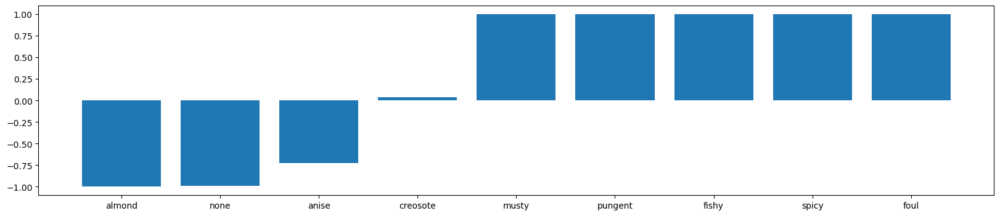

In [50]:
cat = 'odour'
idx = feature_names.index(cat)
plot_bar(cf.d_abs[idx], np.array(categories_dict[idx]), figsize=(20,4))

## SHAP

In [51]:
import shap
shap.initjs()

In [52]:
# Get SHAP
shap_explainer = shap.TreeExplainer(model)
shap_values = shap_explainer(X_test)

In [53]:
shap_values.shape

(1625, 117, 2)

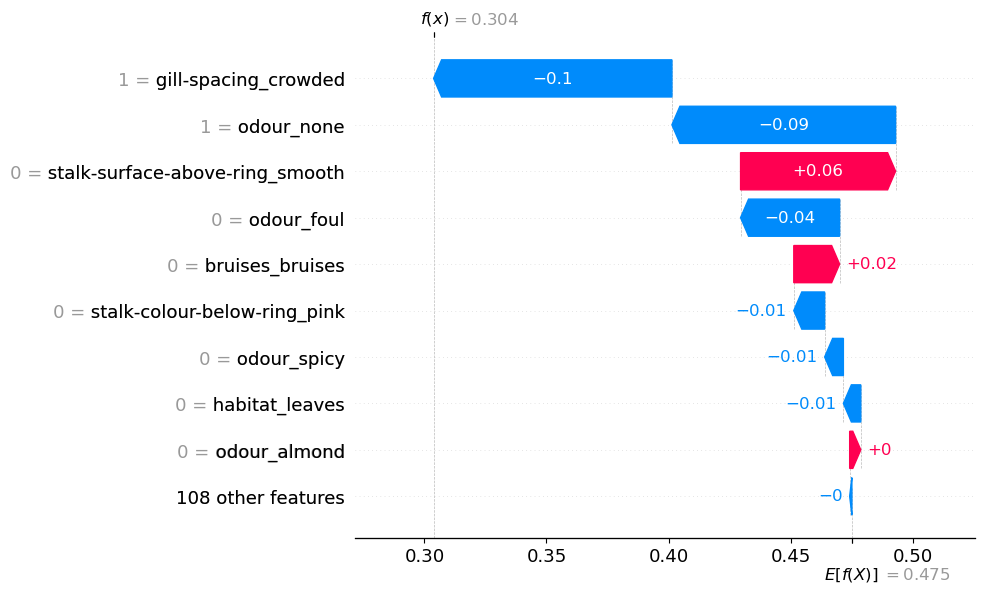

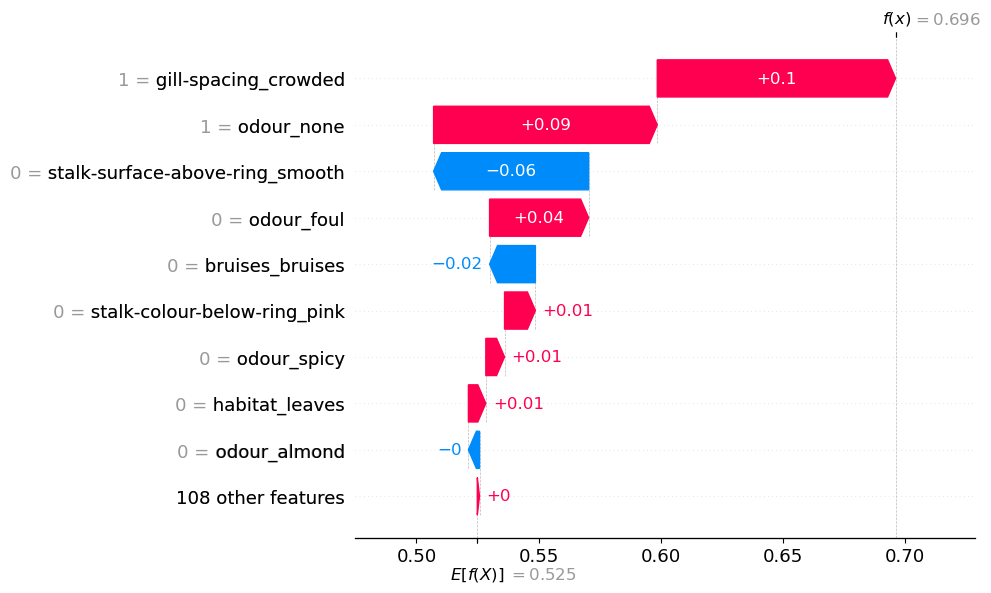

In [54]:
# Waterfall plot
shap.plots.waterfall(shap_values[0, :, 0])

shap.plots.waterfall(shap_values[0, :, 1])

In [55]:
# Force plot
shap.plots.force(shap_values[0, :, 0])

In [56]:
# Force plot
shap.plots.force(shap_values[0, :, 1])

In [57]:
# Get number of unique categories for each feature
n_categories = []
for feat in cat_cols:
    n = df[feat].nunique()
    n_categories.append(n)

In [58]:
new_shap_values = []
for values in shap_values.values:

    #Split shap values into a list for each feature
    values_split = np.split(values , np.cumsum(n_categories[:-1]))

    #Sum values within each list
    values_sum = [sum(l) for l in values_split]
    new_shap_values.append(values_sum)

In [59]:
shap_values.shape

(1625, 117, 2)

In [60]:
X_test.head()

,cap-shape_convex,cap-shape_bell,cap-shape_sunken,cap-shape_flat,cap-shape_knobbed,cap-shape_conical,cap-surface_smooth,cap-surface_scaly,cap-surface_fibrous,cap-surface_grooves,...,population_several,population_solitary,population_clustered,habitat_urban,habitat_grasses,habitat_meadows,habitat_woods,habitat_paths,habitat_waste,habitat_leaves
1392,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4051,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3725,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7177,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
103,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [61]:
# Get same data frame as X_test from train_test_split
X_test_df = df.reindex(X_test.index).drop('class', axis=1)

In [62]:
# Replace shap values
shap_values.values = np.array(new_shap_values)

# Replace data with categorical feature values 
new_data = np.array(X_test_df)
shap_values.data = np.array(new_data)

# Update feature names
shap_values.feature_names = list(cat_cols)

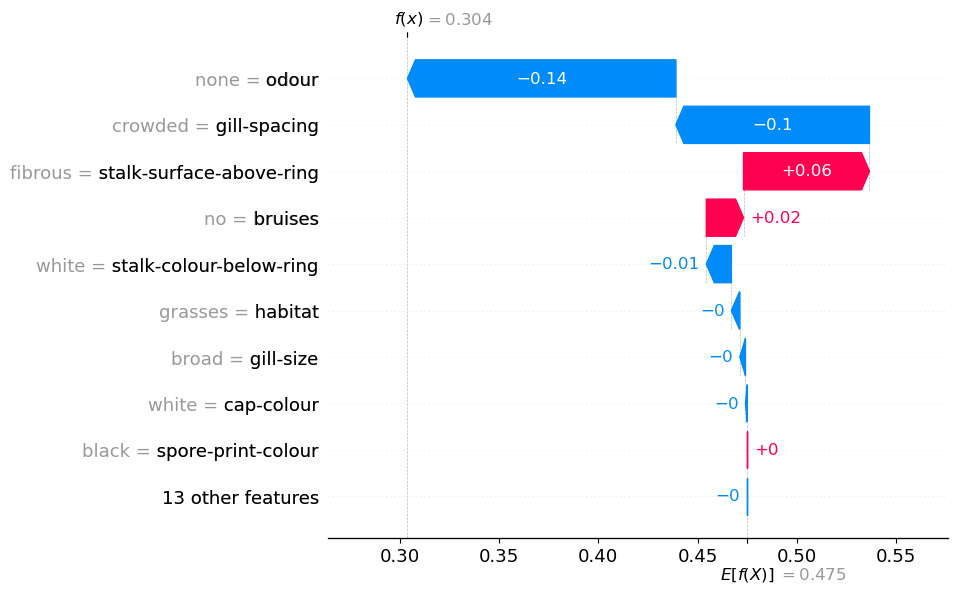

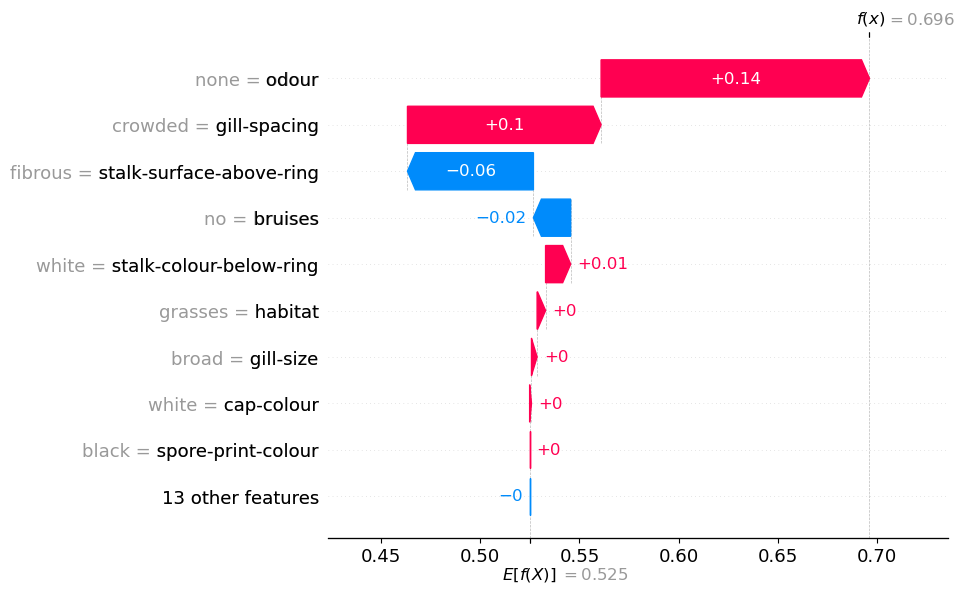

In [63]:
# Waterfall plot
shap.plots.waterfall(shap_values[0, :, 0])

shap.plots.waterfall(shap_values[0, :, 1])

In [64]:
# Force plot of first instance for poisonous class
shap.plots.force(shap_values[0, :, 0])

In [65]:
# Force plot of first instance for edible class
shap.plots.force(shap_values[0, :, 1])

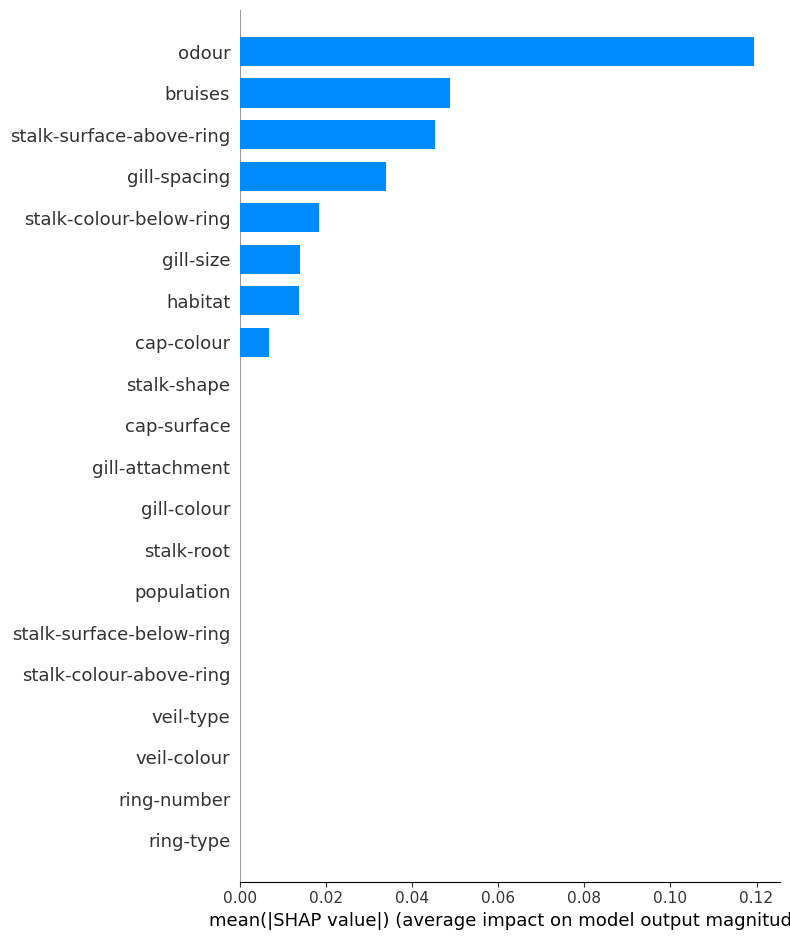

In [66]:
# Create a SHAP summary plot
shap.summary_plot(shap_values[:, :, 1], X_test_df.values, plot_type="bar", feature_names=X_test_df.columns, class_names=model.classes_)

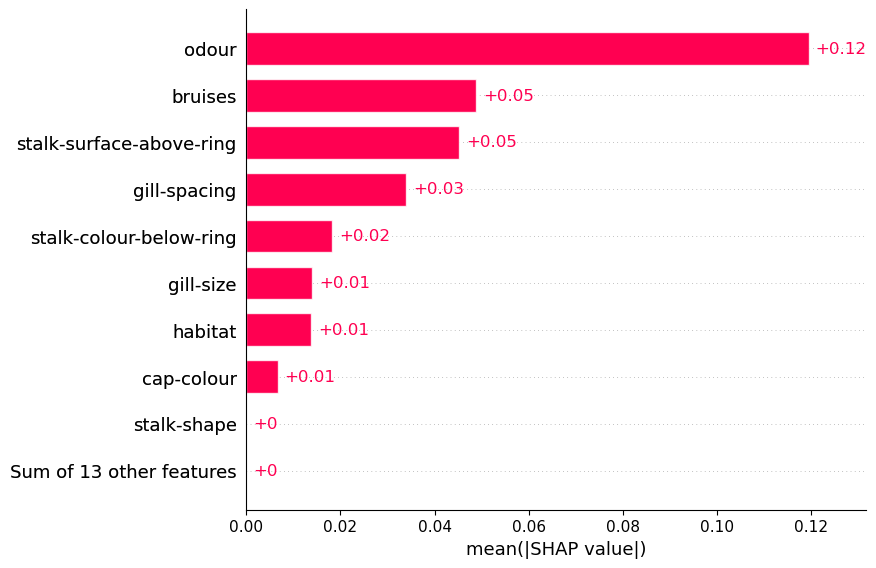

In [67]:
# Mean SHAP
shap.plots.bar(shap_values[:, :, 0])

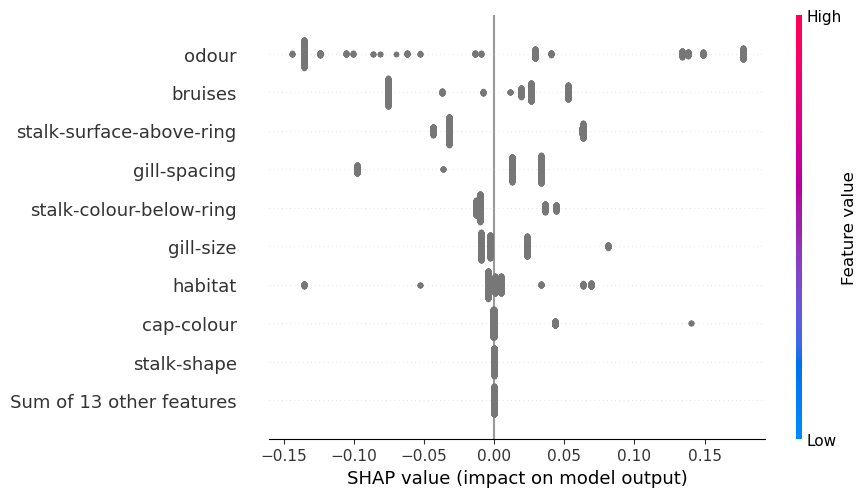

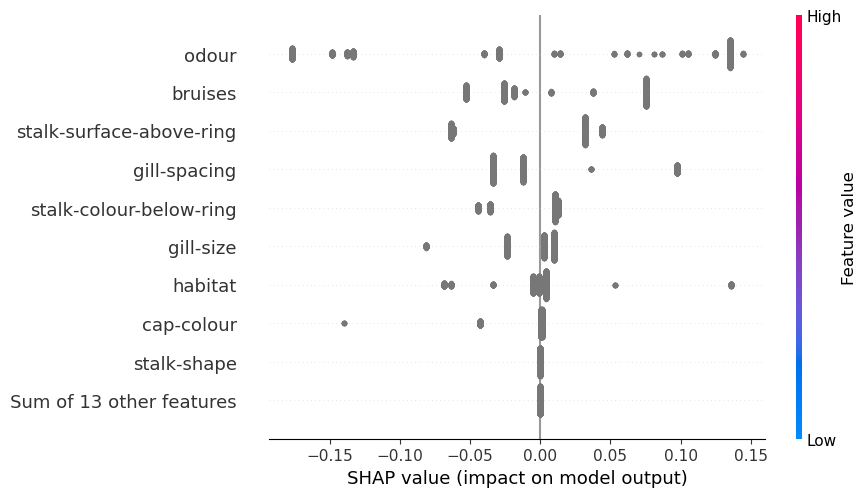

In [68]:
# Because they are categorical it is in the same colour 
shap.plots.beeswarm(shap_values[:, :, 0])

shap.plots.beeswarm(shap_values[:, :, 1])

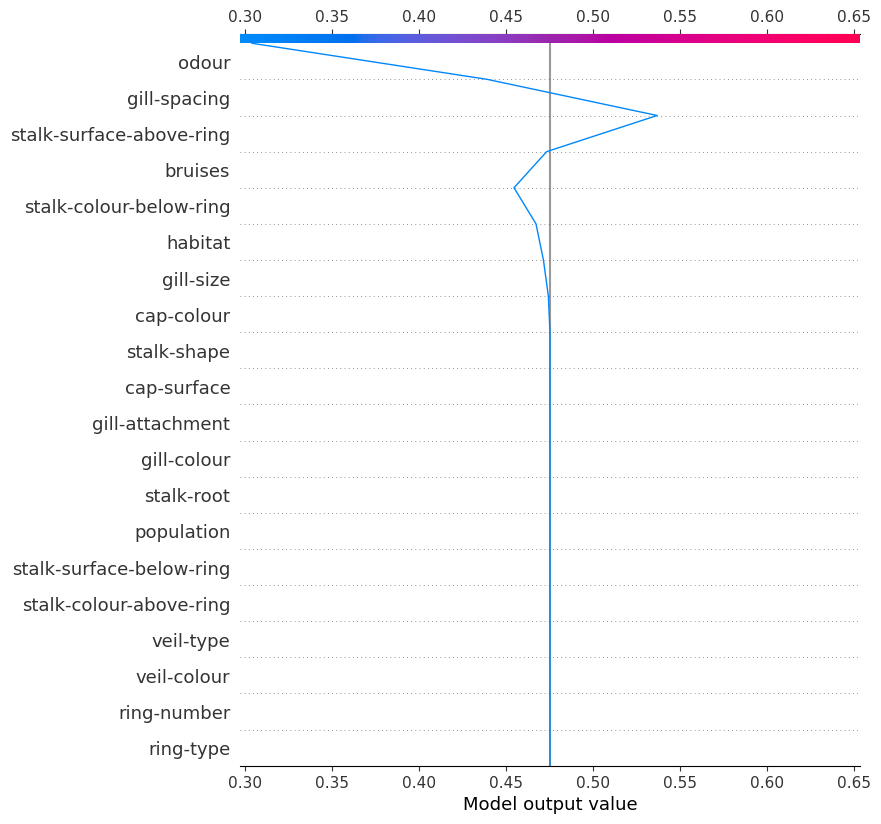

In [69]:
# Expected array with 2 vals, values[instance][features,class]
shap.decision_plot(shap_explainer.expected_value[0], shap_values.values[0, :, 0], X_test_df.columns)

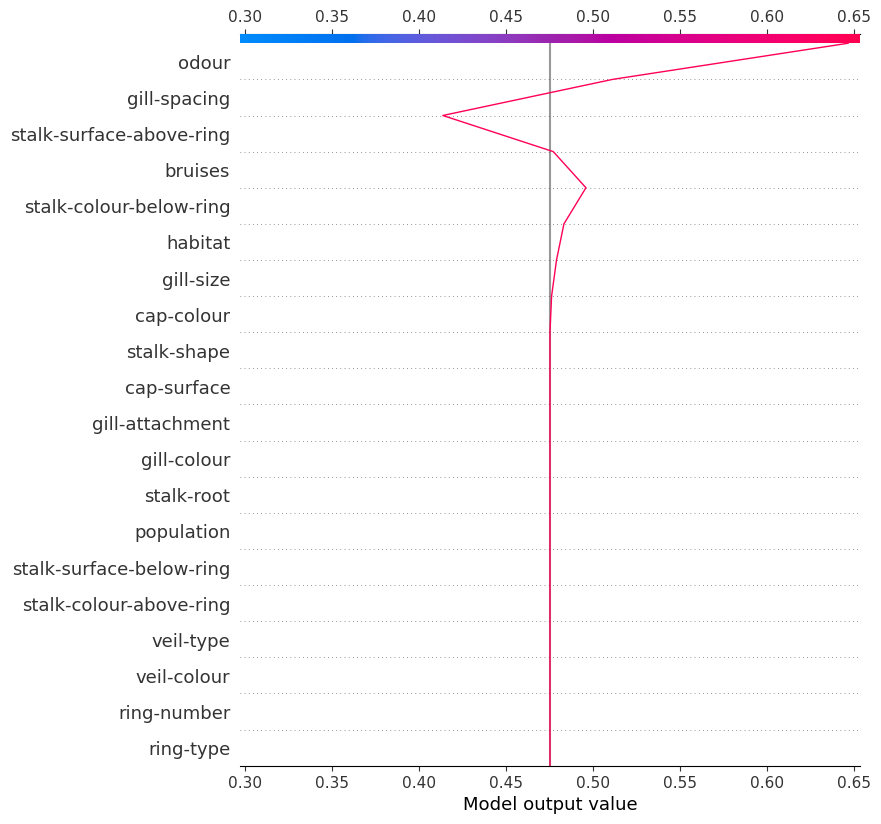

In [70]:
# Expected array with 2 vals, values[instance][features,class]
shap.decision_plot(shap_explainer.expected_value[0], shap_values.values[0, :, 1], X_test_df.columns)

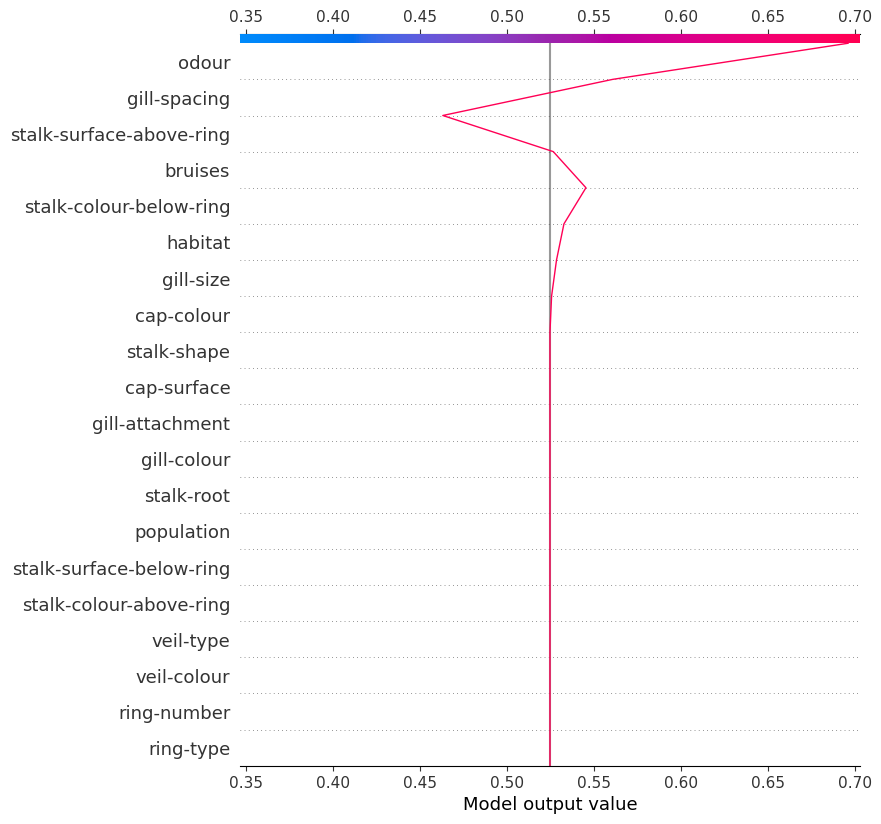

In [71]:
# Expected array with 2 vals, values[instance][features,class]
shap.decision_plot(shap_explainer.expected_value[1], shap_values.values[0, :, 1], X_test_df.columns)

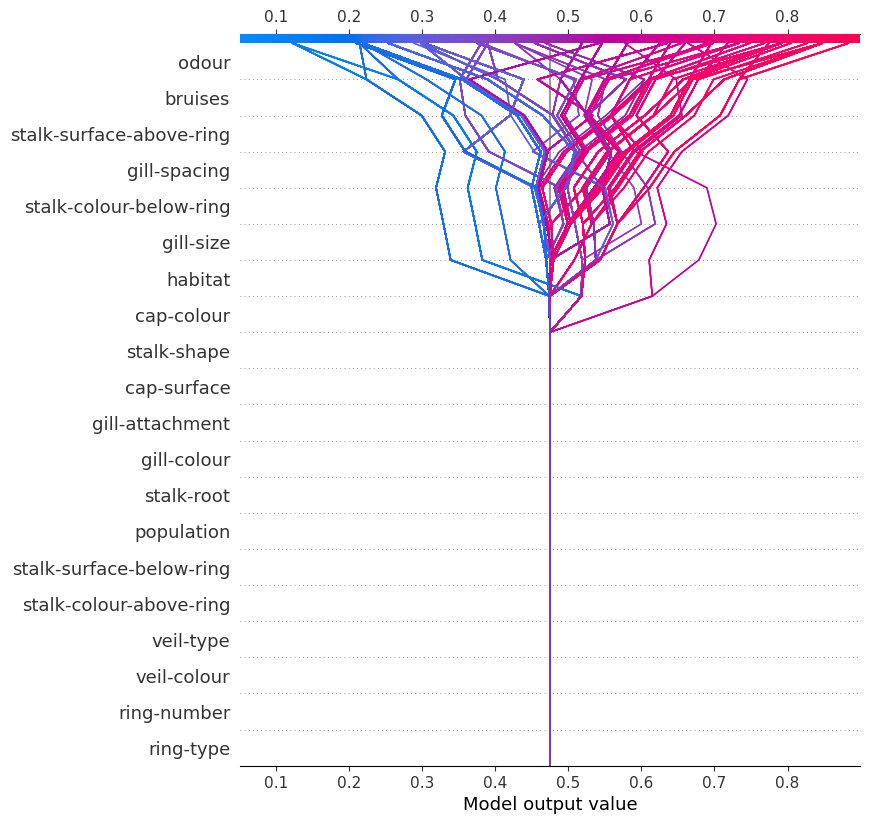

In [72]:
# Create the decision plot
shap.decision_plot(shap_explainer.expected_value[0],
                   shap_values.values[:, :, 0],
                   X_test_df.columns)